# 13. explainability

1. Train at least two advanced models on the energy dataset from TSA_Example notebook. You may choose to use only the last 5 years of the dataset to reduce data size
2. Explain the patterns the model has learned using SHAP local and global plots
3. Explain the patterns using LIME
4. Compare the answers from LIME & SHAP (global & some local) – what do you see? Is it the same?

In [26]:
import os
import kagglehub
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import shap
import lime
import lime.lime_tabular

1. Train at least two advanced models on the energy dataset from TSA_Example notebook. You may choose to use only the last 5 years of the dataset to reduce data size

Loadning data 

In [27]:
path = kagglehub.dataset_download("robikscube/hourly-energy-consumption")
print("Path to dataset files:", path)

files = os.listdir(path)
print(files)

Path to dataset files: C:\Users\abjar\.cache\kagglehub\datasets\robikscube\hourly-energy-consumption\versions\3
['AEP_hourly.csv', 'COMED_hourly.csv', 'DAYTON_hourly.csv', 'DEOK_hourly.csv', 'DOM_hourly.csv', 'DUQ_hourly.csv', 'EKPC_hourly.csv', 'est_hourly.paruqet', 'FE_hourly.csv', 'NI_hourly.csv', 'PJME_hourly.csv', 'PJMW_hourly.csv', 'pjm_hourly_est.csv', 'PJM_Load_hourly.csv']


limiting data to 5 years 

In [28]:
df = pd.read_csv(path + "/PJME_hourly.csv")
df['Datetime'] = pd.to_datetime(df['Datetime'])

last_5_years = df['Datetime'].max() - pd.DateOffset(years=5)
df = df[df['Datetime'] >= last_5_years]

print(f"Dataset shape after filtering: {df.shape}")
print(df.columns)

Dataset shape after filtering: (43823, 2)
Index(['Datetime', 'PJME_MW'], dtype='object')


In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43823 entries, 96409 to 145365
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Datetime  43823 non-null  datetime64[ns]
 1   PJME_MW   43823 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 1.0 MB


data formatting and feature engineering 

In [30]:
df['Datetime'] = pd.to_datetime(df['Datetime'])

df['Year'] = df['Datetime'].dt.year
df['Month'] = df['Datetime'].dt.month
df['Day'] = df['Datetime'].dt.day
df['Hour'] = df['Datetime'].dt.hour 
df['DayOfWeek'] = df['Datetime'].dt.weekday
df['IsWeekend'] = (df['DayOfWeek'] >= 5).astype(int) 

df = df.set_index('Datetime')
df = df.sort_index()

print(df.head())


                     PJME_MW  Year  Month  Day  Hour  DayOfWeek  IsWeekend
Datetime                                                                  
2013-08-03 00:00:00  32081.0  2013      8    3     0          5          1
2013-08-03 01:00:00  29409.0  2013      8    3     1          5          1
2013-08-03 02:00:00  27455.0  2013      8    3     2          5          1
2013-08-03 03:00:00  26207.0  2013      8    3     3          5          1
2013-08-03 04:00:00  25442.0  2013      8    3     4          5          1


We extract useful time-based features (year, month, day, hour, weekday, weekend flag) from the Datetime column. These help the model learn seasonal and daily patterns in energy consumption. We also set Datetime as the index for proper time ordering.

We define our target variable (energy consumption in MW) and use the engineered time-based features as predictors.  
Instead of a random 80/20 split, we split chronologically: the first 80% of the data is used for training, and the last 20% is kept for testing.  
This ensures that the model is evaluated on future (unseen) data, which is important for time series forecasting.


In [31]:
TARGET = "PJME_MW"

df = df.sort_index()
split_idx = int(len(df) * 0.8)
train = df.iloc[:split_idx].copy()
test  = df.iloc[split_idx:].copy()

X_train = train.drop(columns=[TARGET])
y_train = train[TARGET]
X_test  = test.drop(columns=[TARGET])
y_test  = test[TARGET]

print("Train range:", train.index.min(), "→", train.index.max(), "| shape:", X_train.shape)
print("Test  range:", test.index.min(), "→", test.index.max(),  "| shape:", X_test.shape)


Train range: 2013-08-03 00:00:00 → 2017-08-02 19:00:00 | shape: (35058, 6)
Test  range: 2017-08-02 20:00:00 → 2018-08-03 00:00:00 | shape: (8765, 6)


We train an XGBoost regressor on the dataset. XGBoost is a tree-based boosting method that often performs well on structured/tabular data. After training, we evaluate it using MAE and MSE on the test set.

In [32]:
xgb_model = xgb.XGBRegressor(n_estimators=500, learning_rate=0.05, objective='reg:squarederror')
xgb_model.fit(X_train, y_train)

y_pred_xgb = xgb_model.predict(X_test)

mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
print(f"XGBoost - MAE: {mae_xgb:.4f}, MSE: {mse_xgb:.4f}")


XGBoost - MAE: 3450.3725, MSE: 21703061.3710


In [33]:
df.describe()

,PJME_MW,Year,Month,Day,Hour,DayOfWeek,IsWeekend
count,43823.000000,43823.000000,43823.000000,43823.000000,43823.000000,43823.000000,43823.000000
mean,31312.417931,2015.586587,6.524291,15.727289,11.500057,2.999338,0.285832
std,6319.626351,1.497120,3.448612,8.800130,6.922413,2.000359,0.451815
min,19255.000000,2013.000000,1.000000,1.000000,0.000000,0.000000,0.000000
25%,26909.000000,2014.000000,4.000000,8.000000,6.000000,1.000000,0.000000
50%,30368.000000,2016.000000,7.000000,16.000000,12.000000,3.000000,0.000000
75%,34973.500000,2017.000000,10.000000,23.000000,17.500000,5.000000,1.000000
max,56609.000000,2018.000000,12.000000,31.000000,23.000000,6.000000,1.000000


The XGBoost model achieves an MAE of about 3,450 MW and an MSE of about 21.7 million on the test set.  
Given that the average demand is around 31,000 MW (with a standard deviation of ~6,300 MW), this corresponds to roughly an 11% error relative to typical demand levels.  
This performance will serve as our baseline for comparison with other models.


We now train a neural network as our second model. The network has two hidden layers 
with ReLU activation, and we train it using mean squared error as the loss function. Performance is again 
evaluated on the test set using MAE and MSE.

In [34]:
mlp_model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    layers.Dense(32, activation='relu'),
    layers.Dense(1, activation='linear') 
])

mlp_model.compile(optimizer='adam', loss='mse', metrics=['mae'])

history = mlp_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test), verbose=1)

mlp_loss, mlp_mae = mlp_model.evaluate(X_test, y_test)
print(f"MLP - MAE: {mlp_mae:.4f}, MSE: {mlp_loss:.4f}")


Epoch 1/50
1096/1096 [==============================] - 1s 817us/step - loss: 160499920.0000 - mae: 8676.4473 - val_loss: 36026904.0000 - val_mae: 4717.2983
Epoch 2/50
1096/1096 [==============================] - 1s 670us/step - loss: 39552124.0000 - mae: 4950.9111 - val_loss: 35060000.0000 - val_mae: 4656.7744
Epoch 3/50
1096/1096 [==============================] - 1s 661us/step - loss: 38397612.0000 - mae: 4880.4141 - val_loss: 33809900.0000 - val_mae: 4532.0566
Epoch 4/50
1096/1096 [==============================] - 1s 673us/step - loss: 37021560.0000 - mae: 4795.1895 - val_loss: 32427328.0000 - val_mae: 4446.9541
Epoch 5/50
1096/1096 [==============================] - 1s 657us/step - loss: 35457472.0000 - mae: 4701.6392 - val_loss: 31131958.0000 - val_mae: 4439.8750
Epoch 6/50
1096/1096 [==============================] - 1s 782us/step - loss: 33699072.0000 - mae: 4587.6074 - val_loss: 29288762.0000 - val_mae: 4260.1807
Epoch 7/50
1096/1096 [==============================] - 1s 751u

we though it was fun to compare the two models in how well they predict energy consumptions 

274/274 [==============================] - 0s 414us/step


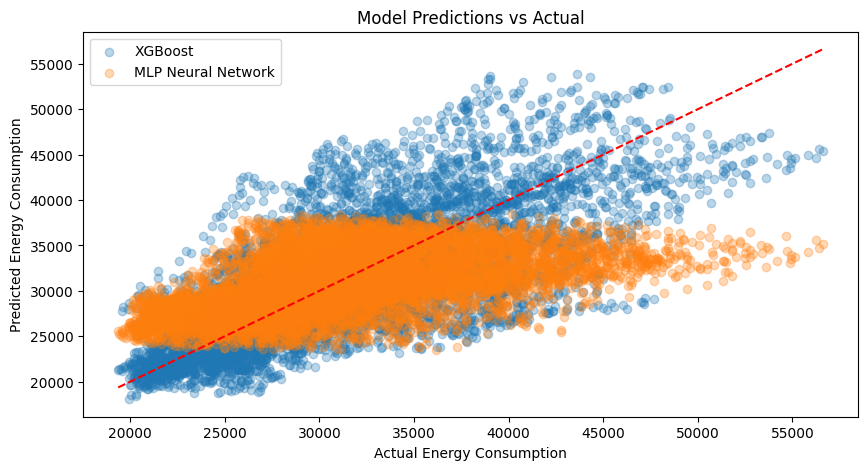

In [35]:
plt.figure(figsize=(10,5))
plt.scatter(y_test, y_pred_xgb, alpha=0.3, label="XGBoost")
plt.scatter(y_test, mlp_model.predict(X_test), alpha=0.3, label="MLP Neural Network")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--')  # Diagonal line
plt.xlabel("Actual Energy Consumption")
plt.ylabel("Predicted Energy Consumption")
plt.legend()
plt.title("Model Predictions vs Actual")
plt.show()


Looking at this it is obvious that MLP struggles with predicting the data, though this could also be because we havent scaled the data, since we think that it is more discernable that way. XGBoost is the clear winner in predicting the energy consumption here

### 2. Explain the patterns the model has learned using SHAP local and global plots

local shap plots for XGBoost

In [36]:
X_test_df = pd.DataFrame(X_test, columns=X.columns) 

explainer_xgb = shap.Explainer(xgb_model)

shap_values_xgb = explainer_xgb(X_test_df)

NameError: name 'X' is not defined

🔹 XGBoost - Local SHAP Explanation for Test Row 10:


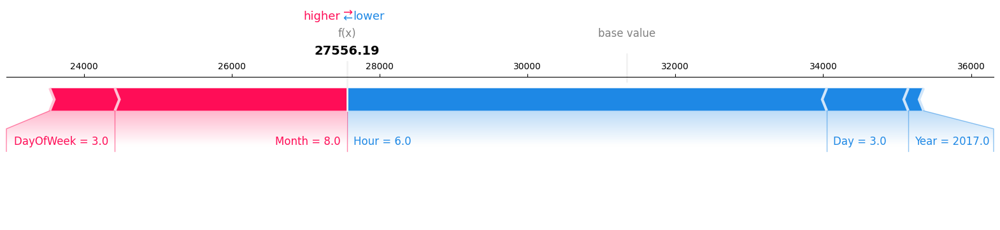

🔹 XGBoost - Local SHAP Explanation for Test Row 50:


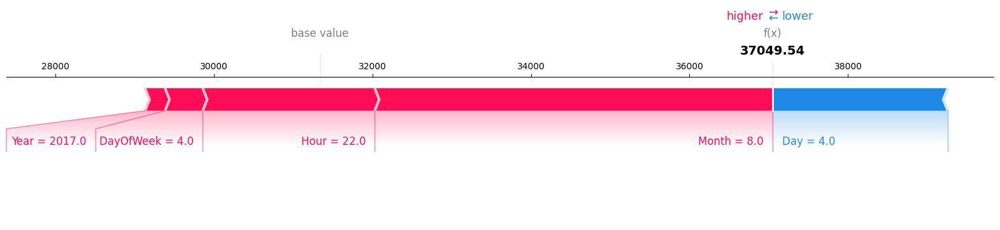

🔹 XGBoost - Local SHAP Explanation for Test Row 100:


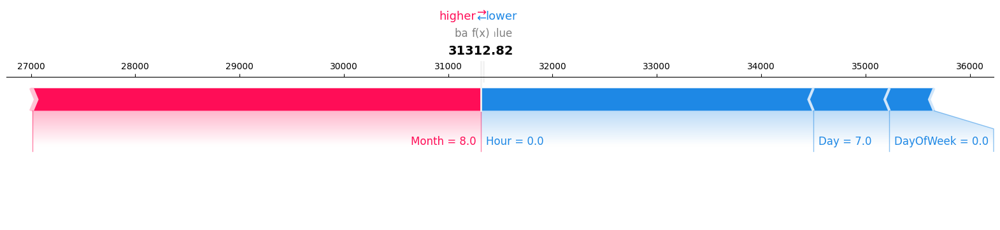

In [ ]:
local_indices = [10, 50, 100]

for idx in local_indices:
    print(f"🔹 XGBoost - Local SHAP Explanation for Test Row {idx}:")
    
    shap_exp = shap.Explanation(
        values=shap_values_xgb[idx], 
        base_values=explainer_xgb.expected_value, 
        data=X_test_df.iloc[idx], 
        feature_names=X_test_df.columns
    )

    shap.force_plot(shap_exp.base_values, shap_exp.values, shap_exp.data, feature_names = shap_exp.feature_names, matplotlib=True)
    plt.show()

looking at the local shap explanation for row 10, the energy consumption is lower. you can see that the time of day is having the largest effect on the energy consumption in this case, this could be because it is early morning.

on the second plot where row 50 is explained, we can see that that largest impact comes from the month being july. looking at the hour it is very insignificant in this case, this could be because there still are some people who are awake, and some who has gone to bed, making it mostly random at that time of the day. though we cant think of a reason why month 7 affects the energy consumption so much 

looking at the last plot for row 100, we can see that it is the hour, and month that affects the energy consumption the most. the time of day being 10 would mean that most peope are awake. though we still think it is perculiar that the month has such a large effect on the energy consumption. 

Global SHAP plot for XGboost

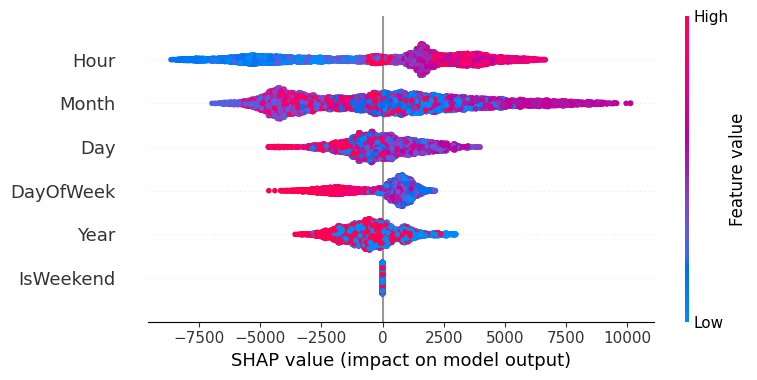

In [ ]:
shap.summary_plot(shap_values_xgb, X_test_df)


looking at the plot, xgboost captures clear trends in timebased effects on energy usage looking at the hour(which is the most important), then we can see that when the hour value is low, then the energy consumption is low, and when its high then the energy consumption is high.
on the plot, we can see the month feature is the second most important, though the distribution seems random. this could maybe be the reason why the months seem so random in the local tests. this could be coming from an external effect, like the weather.   

In [ ]:

def mlp_predict(data):
    return mlp_model.predict(data).flatten() 

explainer_mlp = shap.KernelExplainer(mlp_predict, X_train[:100])  

# only running small test size to avoid long runtime
shap_values_mlp = explainer_mlp.shap_values(X_test[:100], silent = True)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step
1/1 ━━━━━━━━━━

🔹 MLP - Local SHAP Explanation for Test Row 10:


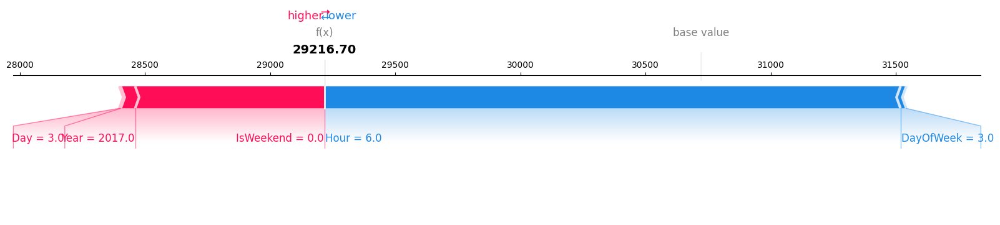

🔹 MLP - Local SHAP Explanation for Test Row 50:


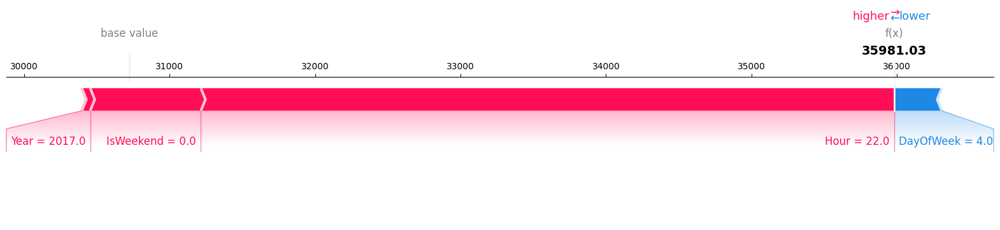

🔹 MLP - Local SHAP Explanation for Test Row 99:


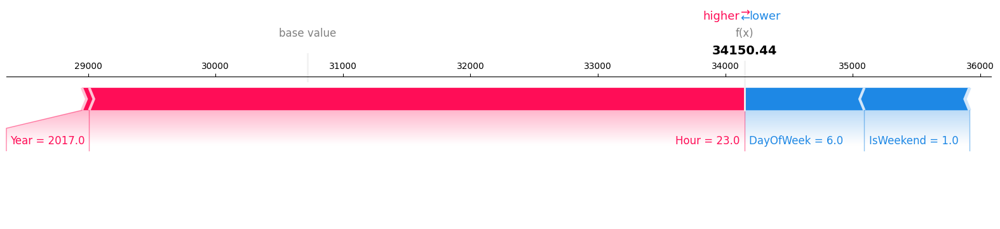

In [ ]:
local_indices = [10, 50, 99]

for idx in local_indices:
    print(f"🔹 MLP - Local SHAP Explanation for Test Row {idx}:")
    
    shap_exp = shap.Explanation(
        values=shap_values_mlp[idx], 
        base_values=explainer_mlp.expected_value, 
        data=X_test_df.iloc[idx], 
        feature_names=X_test_df.columns
    )

    shap.force_plot(shap_exp.base_values, shap_exp.values, shap_exp.data, feature_names = shap_exp.feature_names, matplotlib=True)
    plt.show()


looking at the local SHAP tests from MLP, the one from row 10 is affected the most by the hour being 6. then weekend, month and day of week seem to have an equal effect on the energy consumption. all of the 4 features lower the energy consumption showing that weekends at the end of the year at 6 in the morning have low energy consumption.

for the second local SHAP test we can sees that the hour being 23 affects the energy consumption by a large amount, this is different compared to the SHAP test from XGBoost. it seems that MLP predicts that the consumption will be higher and that the largest factor is the hour of the day.

lastly we have explanation for row 99, where both day of week and hour seem to have an equal impact on the energy consumption. furthermore it is not weekend which tells us that people are probably working, which would raise energy consumption. though it still being fairly early in the day lowers it. 

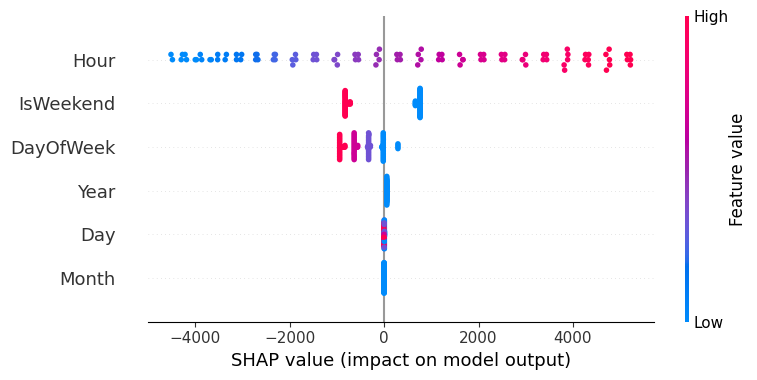

In [ ]:
X_test_df = pd.DataFrame(X_test[:100], columns=X.columns)

shap.summary_plot(shap_values_mlp, X_test_df)

since the shap kernel has some limitations, it is a bit harder to discern the tendencies.

MLP deems hour more important, but next is if its weekend or not. You can see that it the model deems that hours has the largest impact again, like XGBOost does, and also when hours are higher then energy consumption is higher. IsWeekend also shows the same pattern as XGBoost where the energy consumption is higher during the weekdays and lower during the weekend. though here it is the second most impactful feature. 
looking at the impacts on model output we can see that MLP clearer view on whether high or low values impact on energy consumption. here the values in XGBoost seemed a bit more random at times 

3. Explain the patterns using LIME

In [ ]:
X_test = pd.DataFrame(X_test, columns=X.columns)
explainer_lime_xgb = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train), 
    feature_names=X.columns, 
    mode='regression'
)

we have to render the LIME with HTML since we are working with VScode in darkmode, otherwise we cant read the tests.

In [ ]:
from IPython.core.display import display, HTML
local_indices = [10, 50, 100]

for idx in local_indices:
    print(f"\n🔹 **LIME Explanation for XGBoost - Test Row {idx}**")

    exp_xgb = explainer_lime_xgb.explain_instance(
        data_row=X_test.iloc[idx], 
        predict_fn=xgb_model.predict, 
        num_features=5  
    )

    # render the lime with white background for readability
    html_xgb = exp_xgb.as_html()
    display(HTML(f'<div style="background-color:white;">{html_xgb}</div>'))



🔹 **LIME Explanation for XGBoost - Test Row 10**


C:\Users\Jonathan Olsen\AppData\Local\Temp\ipykernel_10716\2997600856.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython.display
  from IPython.core.display import display, HTML
c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `

c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as posit


🔹 **LIME Explanation for XGBoost - Test Row 50**


c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as posit


🔹 **LIME Explanation for XGBoost - Test Row 100**


in the first lime plot, the model predicts low energy usage. in the row it is early morning during a weekend during the end of the year where people could be on holiday

in the second plot, the model predicts a higher energy consumption due to evening peak hours and it being a weekday. Though since it is summer energy consumption could be lower since people are more outside and there is more light outside.

for the third plot it is in the spring, in the middle of the week, and nearing midday, which all drive up energy consumption. the month could have such a large impact because of heating usage, and the importance of week day could suggest workday activity

In [ ]:
explainer_lime_mlp = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train), 
    feature_names=X.columns, 
    mode='regression'
)

In [ ]:
local_indices = [10, 50, 99]

for idx in local_indices:
    print(f"\n🔹 **LIME Explanation for MLP - Test Row {idx}**")
    
    exp_mlp = explainer_lime_mlp.explain_instance(
        data_row=X_test.iloc[idx], 
        predict_fn=mlp_model.predict, 
        num_features=5 
    )
    
    # render the lime with white background for readability
    html_mlp = exp_mlp.as_html()
    display(HTML(f'<div style="background-color:white;">{html_mlp}</div>'))


🔹 **LIME Explanation for MLP - Test Row 10**
 70/157 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step

c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as posit

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\lime_tabular.py:427: FutureWarning: Series.__getitem__ treating keys as posit


🔹 **LIME Explanation for MLP - Test Row 50**
 59/157 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step

c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as posit

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step


c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\lime_tabular.py:427: FutureWarning: Series.__getitem__ treating keys as posit


🔹 **LIME Explanation for MLP - Test Row 99**
  1/157 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step

c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as posit

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step


c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\Jonathan Olsen\Desktop\CS RUC\DATJOAF\DataAndThingsReExam\.venvP310\lib\site-packages\lime\lime_tabular.py:427: FutureWarning: Series.__getitem__ treating keys as posit

in the first test, MLP predicts low energy consumption due to early morning hours, weekend, and late autumn/winter, just like XGboost did. all the contributing factors negatively impact the demand, making this a low consumption scenario

in the second test, a higher energy consumption is predicted by MLP, this is probably due to evening peak usage on a weekday. Month and late-month days slightly reduce the prediction, thoguh not enough to offset peak hour effects

in the third test the model predicts moderate energy usage because it’s early in the week, mid-morning, during summer. it being a workday and the yearly trend increase consumption, but morning hours slightly lower it.

4. Compare the answers from LIME & SHAP (global & some local) – what do you see? Is it the same?

in the global explanation in SHAP, XGBoost indicates that Hour, Month and DayOfWeek have the most significant impact on predictions, with Hour having the widest range of SHAP values. MLP has fewer datapoints(due to limits of SHAP kernel) though Hour, and Month remain important. MLP also deems IsWeekend more impactful, instead of DayOfWeek, though they can both tell us if it is weekend in principal. SHAP consistently show us that Hour is the strongest predictor in both models, while Month also plays crucial role. However, the importance ranking of features differs slightly between MLP and XGBoost

in 4 of 6 local XGBoost tests(both SHAP and LIME), Hour has the largest impact on the energy consumption which also follow the global explanation. this is also true for 5 of 6 local MLP tests (both SHAP and LIME), here Hour also ahs the largest impact on energy consumption, and these tendencies also follow the global explanation.

Both methods agree that Hour, Month, and DayOfWeek play key roles, though their ranking varies depending on the model and instance.